In [2]:
import sys
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.10.1 anndata==0.10.7 umap==0.5.6 numpy==1.26.4 scipy==1.11.4 pandas==2.1.4 scikit-learn==1.2.2 statsmodels==0.14.0 igraph==0.11.5 pynndescent==0.5.12


In [2]:
adata = sc.read_h5ad('VTA_Neuron.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 11906 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Neuron', 'Sample', 'Neuron_merge'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogram_leiden_res_1.20', 'dendrogram_leiden_res_1.50', 'hvg', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.80', 'leiden_res_0.80_colors', 'leiden_res_1.00', 'leiden_res_1.00_colors', 'leiden_res_1.20', 'leiden_res_1.20_colors', 'leiden_res_1.50', 'leiden_res_1.50_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    

In [4]:
del adata.uns['dendrogram_leiden_res_0.50']
del adata.uns['dendrogram_leiden_res_0.80']
del adata.uns['dendrogram_leiden_res_1.00']
del adata.uns['dendrogram_leiden_res_1.20']
del adata.uns['dendrogram_leiden_res_1.50']
del adata.uns['leiden_res_0.50']
del adata.uns['leiden_res_0.80']
del adata.uns['leiden_res_1.00']
del adata.uns['leiden_res_1.20']
del adata.uns['leiden_res_1.50']
del adata.uns['leiden_res_0.50_colors']
del adata.uns['leiden_res_0.80_colors']
del adata.uns['leiden_res_1.00_colors']
del adata.uns['leiden_res_1.20_colors']
del adata.uns['leiden_res_1.50_colors']

In [5]:
adata

AnnData object with n_obs × n_vars = 11906 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Neuron', 'Sample', 'Neuron_merge'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'hvg', 'neighbors', 'pca', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    with n_comps=50


/opt/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    finished (0:00:01)


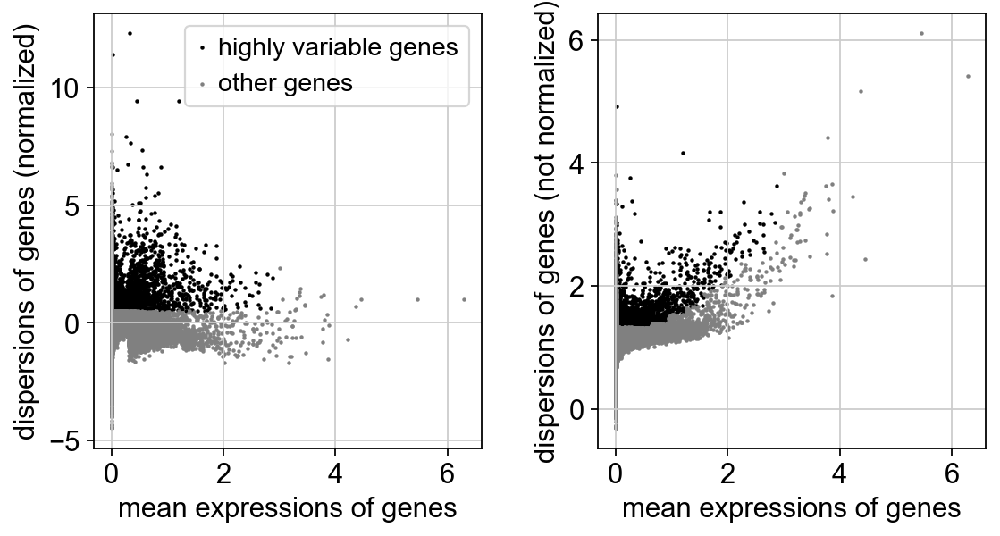

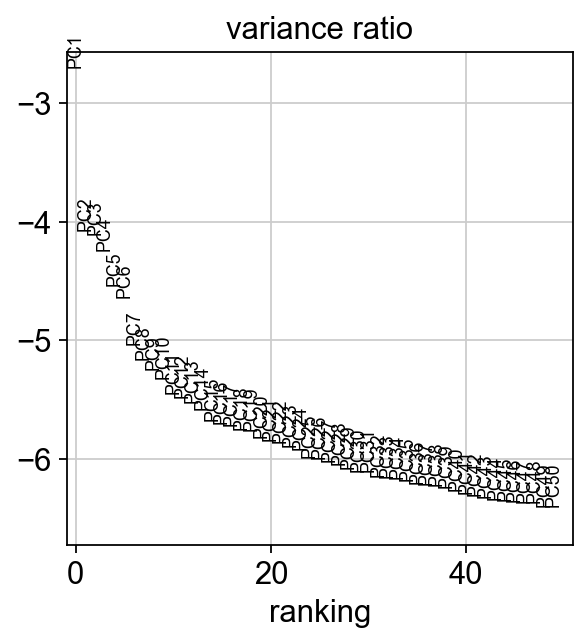

2024-05-21 15:58:27,285 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-05-21 15:58:28,663 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-05-21 15:58:28,692 - harmonypy - INFO - Iteration 1 of 10
2024-05-21 15:58:29,755 - harmonypy - INFO - Iteration 2 of 10
2024-05-21 15:58:30,712 - harmonypy - INFO - Converged after 2 iterations


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


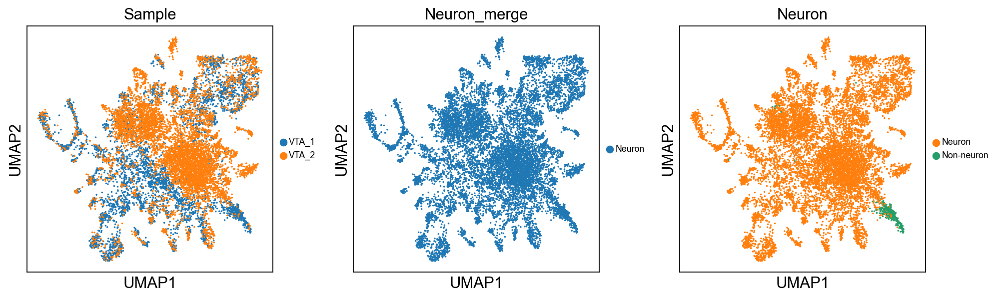

In [6]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5,flavor='seurat')
sc.set_figure_params(color_map='RdBu_r')
sc.tl.pca(adata, svd_solver='arpack',use_highly_variable=True)
sc.pl.highly_variable_genes(adata)
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)
sc.external.pp.harmony_integrate(adata, 'Sample', basis='X_pca', adjusted_basis='X_harmony')
sc.pp.neighbors(adata, n_neighbors=20, use_rep='X_harmony')
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color=["Sample","Neuron_merge","Neuron"],
    legend_fontsize=8
)

In [7]:
adata.obs

,n_genes,percent_mito,n_counts,doublet_score,predicted_doublet,Neuron,Sample,Neuron_merge
AAACCCAAGACTGTTC-1-VTA_1,2892,0.0,6381.0,0.093149,False,Neuron,VTA_1,Neuron
AAACCCAGTAACGCGA-1-VTA_1,4184,0.0,10386.0,0.089820,False,Neuron,VTA_1,Neuron
AAACCCAGTCACTAGT-1-VTA_1,3622,0.0,8986.0,0.032307,False,Neuron,VTA_1,Neuron
AAACGAAAGAGCATTA-1-VTA_1,1570,0.0,2479.0,0.013114,False,Neuron,VTA_1,Neuron
AAACGAAAGGTCACAG-1-VTA_1,2094,0.0,3892.0,0.030684,False,Neuron,VTA_1,Neuron
...,...,...,...,...,...,...,...,...
TTTGTTGGTGTCACAT-1-VTA_2,1400,0.0,2185.0,0.028685,False,Neuron,VTA_2,Neuron
TTTGTTGGTTACCTGA-1-VTA_2,1561,0.0,2689.0,0.072700,False,Neuron,VTA_2,Neuron
TTTGTTGGTTCCCACT-1-VTA_2,2275,0.0,4429.0,0.039110,False,Neuron,VTA_2,Neuron
TTTGTTGTCACGAACT-1-VTA_2,4517,0.0,13127.0,0.111898,False,Neuron,VTA_2,Neuron


In [8]:
VTA_1 = adata[adata.obs['Sample'] == 'VTA_1',:]
VTA_2 = adata[adata.obs['Sample'] == 'VTA_2',:]

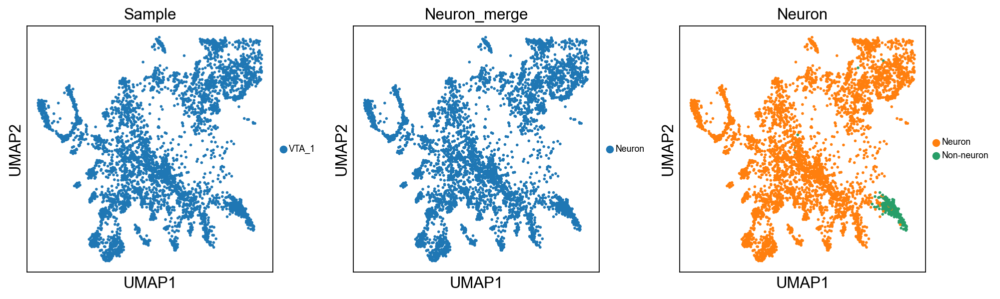

In [9]:
sc.pl.umap(
    VTA_1,
    color=["Sample","Neuron_merge","Neuron"],
    legend_fontsize=8
)

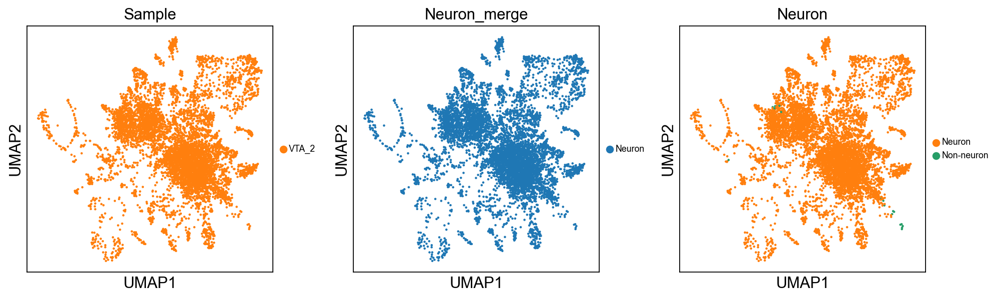

In [10]:
sc.pl.umap(
    VTA_2,
    color=["Sample","Neuron_merge","Neuron"],
    legend_fontsize=8
)

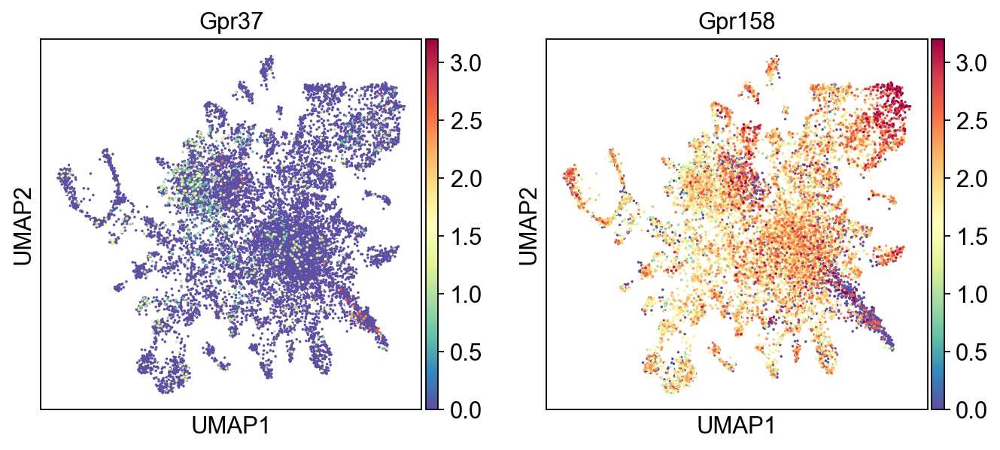

In [20]:
sc.pl.umap(
    adata,
    color=["Gpr37","Gpr158"],
    legend_fontsize=8,cmap='Spectral_r',vmax = 3.2
)

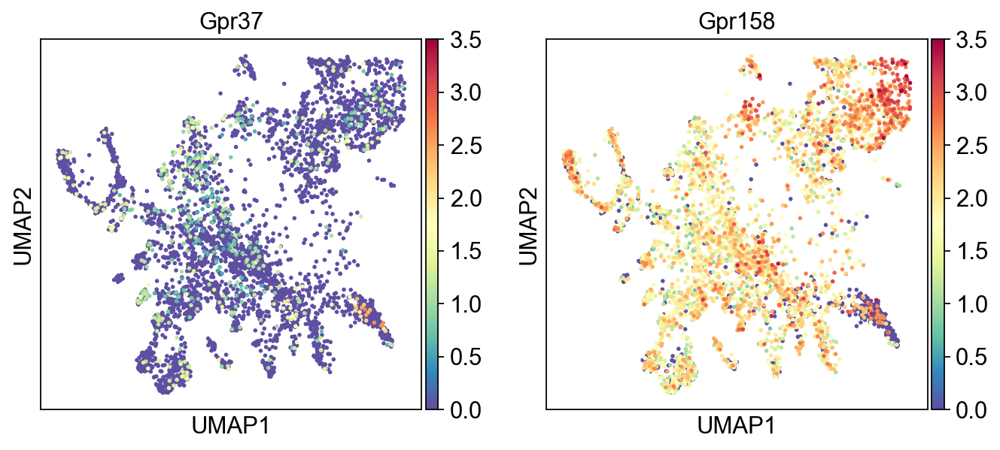

In [11]:
sc.pl.umap(
    VTA_1,
    color=["Gpr37","Gpr158"],
    legend_fontsize=8,cmap='Spectral_r',vmax = 3.5
)

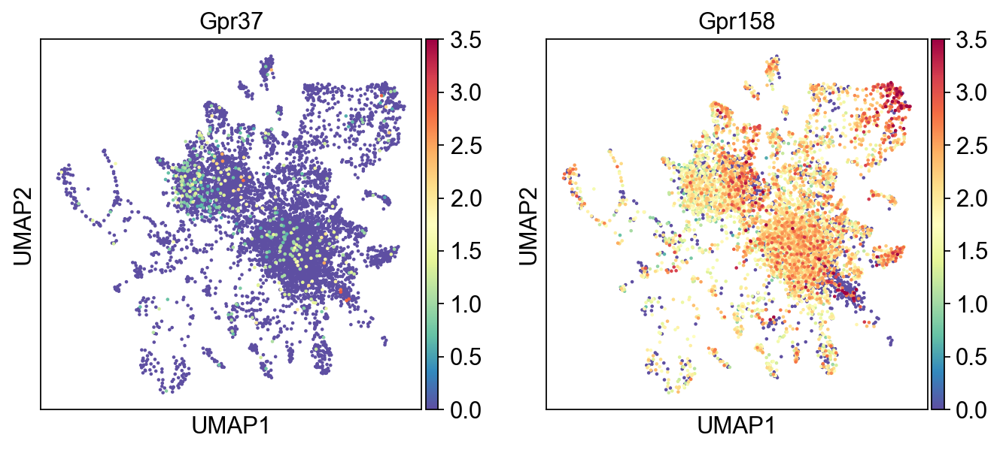

In [12]:
sc.pl.umap(
    VTA_2,
    color=["Gpr37","Gpr158"],
    legend_fontsize=8,cmap='Spectral_r',vmax = 3.5
)

In [13]:
for res in [0.5,0.8,1.0,1.2,1.5]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

running Leiden clustering
    finished: found 23 clusters and added
    'leiden_res_0.50', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 31 clusters and added
    'leiden_res_0.80', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 31 clusters and added
    'leiden_res_1.00', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 34 clusters and added
    'leiden_res_1.20', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 43 clusters and added
    'leiden_res_1.50', the cluster labels (adata.obs, categorical) (0:00:00)


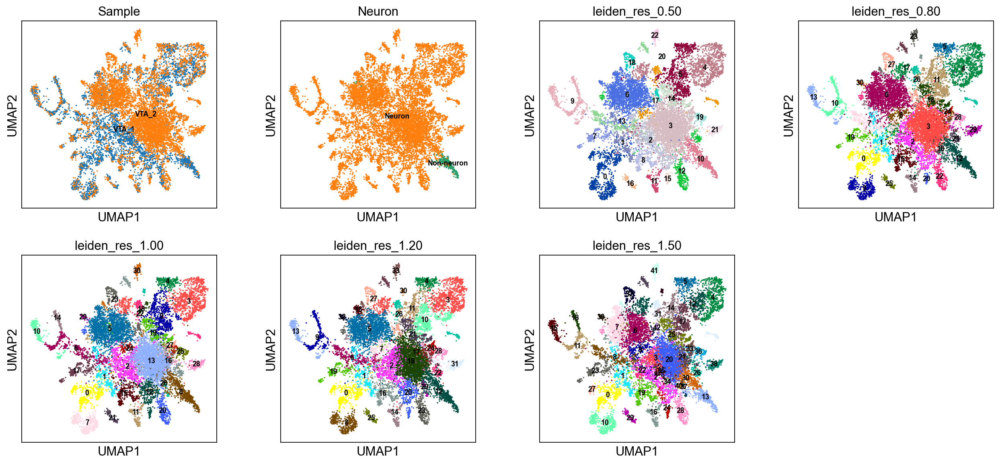

In [14]:
sc.pl.umap(
    adata,
    color=["Sample","Neuron","leiden_res_0.50", "leiden_res_0.80","leiden_res_1.00","leiden_res_1.20","leiden_res_1.50"],
    legend_loc="on data",legend_fontsize=8
)

In [83]:
marker_gene = ['Slc17a6','Slc17a7','Slc17a8','Snap25','Slc32a1','Slc18a2','Gad1','Gad2','Aldh1a1','Th','Ddc','Slc6a3','Slc6a4','Tph2']

In [16]:
for res in [0.5,0.8,1.0,1.2,1.5]:
    sc.tl.dendrogram(adata, groupby=f"leiden_res_{res:4.2f}")

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res_0.50']`
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res_0.80']`
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res_1.00']`
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res_1.20']`
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res_1.50']`


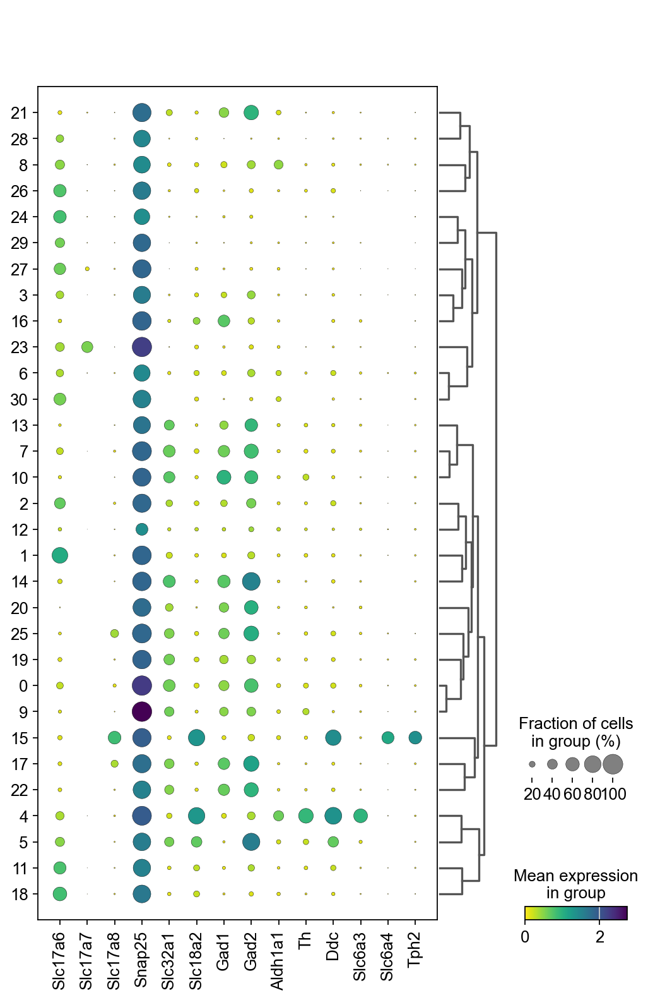

In [84]:
sc.pl.dotplot(adata, marker_gene,groupby=["leiden_res_0.80"],cmap='viridis_r',dendrogram=True)

In [21]:
adata.obs['leiden_res_0.80']

AAACCCAAGACTGTTC-1-VTA_1     0
AAACCCAGTAACGCGA-1-VTA_1     1
AAACCCAGTCACTAGT-1-VTA_1     2
AAACGAAAGAGCATTA-1-VTA_1     4
AAACGAAAGGTCACAG-1-VTA_1     5
                            ..
TTTGTTGGTGTCACAT-1-VTA_2    23
TTTGTTGGTTACCTGA-1-VTA_2     3
TTTGTTGGTTCCCACT-1-VTA_2    18
TTTGTTGTCACGAACT-1-VTA_2     6
TTTGTTGTCCTCTTTC-1-VTA_2    11
Name: leiden_res_0.80, Length: 11906, dtype: category
Categories (31, object): ['0', '1', '2', '3', ..., '27', '28', '29', '30']

In [22]:
adata

AnnData object with n_obs × n_vars = 11906 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Neuron', 'Sample', 'Neuron_merge', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'hvg', 'neighbors', 'pca', 'umap', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'leiden_res_0.50_colors', 'leiden_res_0.80_colors', 'leiden_res_1.00_colors', 'leiden_res_1.20_colors', 'leiden_res_1.50_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogr

In [23]:
adata.write('VTA_Neuron_clustering.h5ad')

In [24]:
adata

AnnData object with n_obs × n_vars = 11906 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Neuron', 'Sample', 'Neuron_merge', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'hvg', 'neighbors', 'pca', 'umap', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'leiden_res_0.50_colors', 'leiden_res_0.80_colors', 'leiden_res_1.00_colors', 'leiden_res_1.20_colors', 'leiden_res_1.50_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogr

In [86]:
Class = []
for i in range(adata.shape[0]):
    if (int(adata.obs['leiden_res_0.80'][i]) in (18,11,1,30,23,27,29,24,26,28)): 
        Class.append('Glut')
    elif (int(adata.obs['leiden_res_0.80'][i]) in (22,9,19,20,14,10,13,16,21)): 
        Class.append('GABA')
    elif (int(adata.obs['leiden_res_0.80'][i]) in (5,17,0,25,2,7,6,3,8)): 
        Class.append('GABA-Glut')
    elif (int(adata.obs['leiden_res_0.80'][i]) == 15): 
        Class.append('Glut-Sero')
    elif (int(adata.obs['leiden_res_0.80'][i]) == 4): 
        Class.append('Dopa')
    else: 
        Class.append('Non-neuron')
adata.obs['Class'] = Class

/var/folders/r4/hfj1yx3s3bd93mtgxzfwcfyc0000gn/T/ipykernel_13379/638759106.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if (int(adata.obs['leiden_res_0.80'][i]) in (18,11,1,30,23,27,29,24,26,28)):
/var/folders/r4/hfj1yx3s3bd93mtgxzfwcfyc0000gn/T/ipykernel_13379/638759106.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  elif (int(adata.obs['leiden_res_0.80'][i]) in (22,9,19,20,14,10,13,16,21)):
/var/folders/r4/hfj1yx3s3bd93mtgxzfwcfyc0000gn/T/ipykernel_13379/638759106.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as 

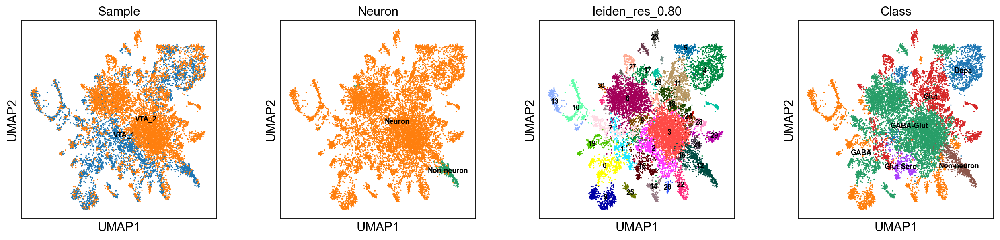

In [87]:
sc.pl.umap(
    adata,
    color=["Sample","Neuron","leiden_res_0.80","Class"],
    legend_loc="on data",legend_fontsize=8
)

In [73]:
test_4=adata[adata.obs['leiden_res_0.80'] == '4',:]

In [76]:
test_4.obs

,n_genes,percent_mito,n_counts,doublet_score,predicted_doublet,Neuron,Sample,Neuron_merge,leiden_res_0.50,leiden_res_0.80,leiden_res_1.00,leiden_res_1.20,leiden_res_1.50,Class
AAACGAAAGAGCATTA-1-VTA_1,1570,0.0,2479.0,0.013114,False,Neuron,VTA_1,Neuron,4,4,3,3,4,Glut-Sero
AAACGAAGTACTGAGG-1-VTA_1,3301,0.0,7543.0,0.058888,False,Neuron,VTA_1,Neuron,4,4,3,3,12,Glut-Sero
AAACGAATCACACCGG-1-VTA_1,3381,0.0,7678.0,0.064478,False,Neuron,VTA_1,Neuron,4,4,3,3,12,Glut-Sero
AAAGGATGTGACGCCT-1-VTA_1,3848,0.0,8278.0,0.044353,False,Neuron,VTA_1,Neuron,4,4,3,3,12,Glut-Sero
AAAGGGCGTCCTACGG-1-VTA_1,4529,0.0,9807.0,0.052417,False,Neuron,VTA_1,Neuron,4,4,2,2,2,Glut-Sero
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCCTCGTACATTGC-1-VTA_2,3315,0.0,10266.0,0.041681,False,Neuron,VTA_2,Neuron,4,4,3,3,4,Glut-Sero
TTTCGATAGCATCGAG-1-VTA_2,1983,0.0,3617.0,0.017841,False,Neuron,VTA_2,Neuron,4,4,3,3,4,Glut-Sero
TTTGACTCAGCTTCGG-1-VTA_2,2504,0.0,4284.0,0.115636,False,Neuron,VTA_2,Neuron,4,4,3,3,12,Glut-Sero
TTTGGAGCAACTGATC-1-VTA_2,1494,0.0,2275.0,0.053105,False,Neuron,VTA_2,Neuron,4,4,3,10,4,Glut-Sero


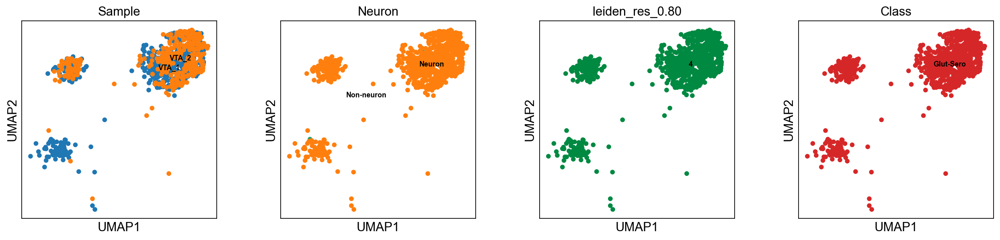

In [75]:
sc.pl.umap(
    test_4,
    color=["Sample","Neuron","leiden_res_0.80","Class"],
    legend_loc="on data",legend_fontsize=8
)

In [80]:
test_3=adata[adata.obs['leiden_res_1.20'] == '3',:]

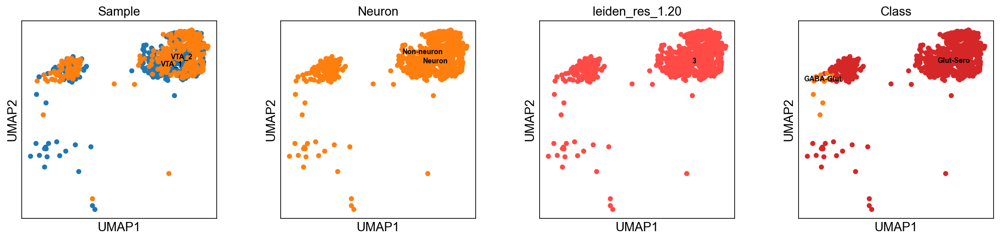

In [81]:
sc.pl.umap(
    test_3,
    color=["Sample","Neuron","leiden_res_1.20","Class"],
    legend_loc="on data",legend_fontsize=8
)

In [88]:
Class_counts = adata.obs['Class'].value_counts()
print(Class_counts)

Class
GABA-Glut     6169
Glut          2038
GABA          1771
Dopa          1085
Non-neuron     577
Glut-Sero      266
Name: count, dtype: int64


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Class']`


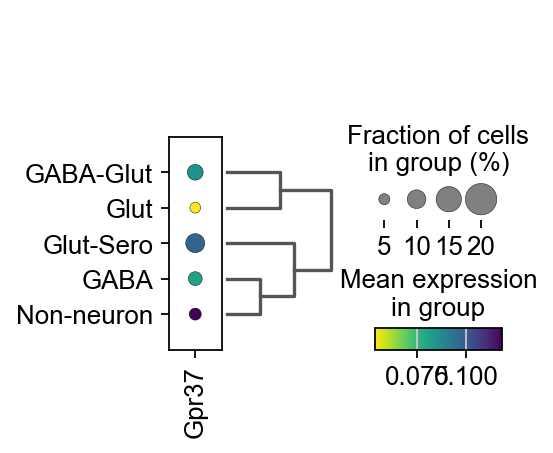

In [28]:
sc.pl.dotplot(adata, "Gpr37",groupby=["Class"],cmap='viridis_r',dendrogram=True)

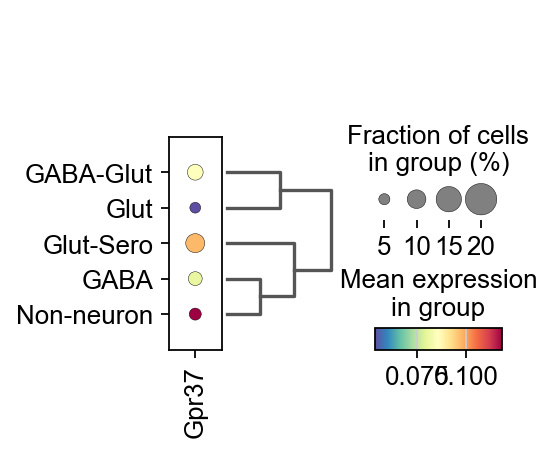

In [29]:
sc.pl.dotplot(adata, "Gpr37",groupby=["Class"],cmap='Spectral_r',dendrogram=True)

In [97]:
Neuron = adata[adata.obs['Class'].isin (['GABA-Glut','Glut','GABA','Dopa']),:]

In [110]:
gaba_glut = adata[adata.obs['Class']== 'GABA-Glut',:]

In [111]:
gaba_glut

View of AnnData object with n_obs × n_vars = 6169 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Neuron', 'Sample', 'Neuron_merge', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'Class'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'hvg', 'neighbors', 'pca', 'umap', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'leiden_res_0.50_colors', 'leiden_res_0.80_colors', 'leiden_res_1.00_colors', 'leiden_res_1.20_colors', 'leiden_res_1.50_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrog

In [112]:
gaba_glut.write('VTA_GABA_Glut.h5ad')

In [98]:
Neuron

View of AnnData object with n_obs × n_vars = 11063 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Neuron', 'Sample', 'Neuron_merge', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'Class'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'hvg', 'neighbors', 'pca', 'umap', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'leiden_res_0.50_colors', 'leiden_res_0.80_colors', 'leiden_res_1.00_colors', 'leiden_res_1.20_colors', 'leiden_res_1.50_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendro

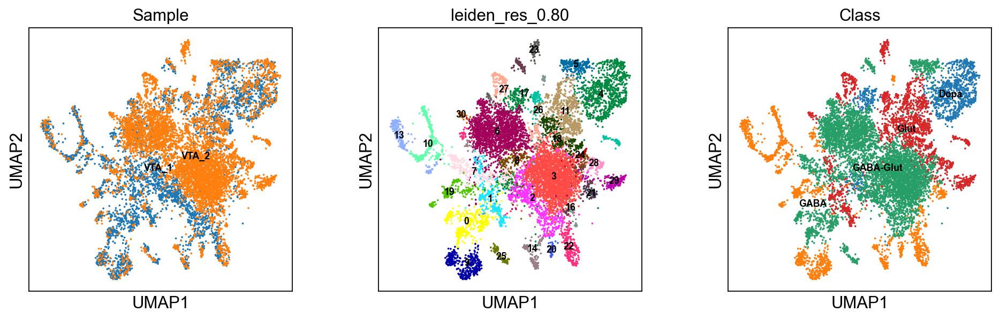

In [99]:
sc.pl.umap(
    Neuron,
    color=["Sample","leiden_res_0.80","Class"],
    legend_loc="on data",legend_fontsize=8
)

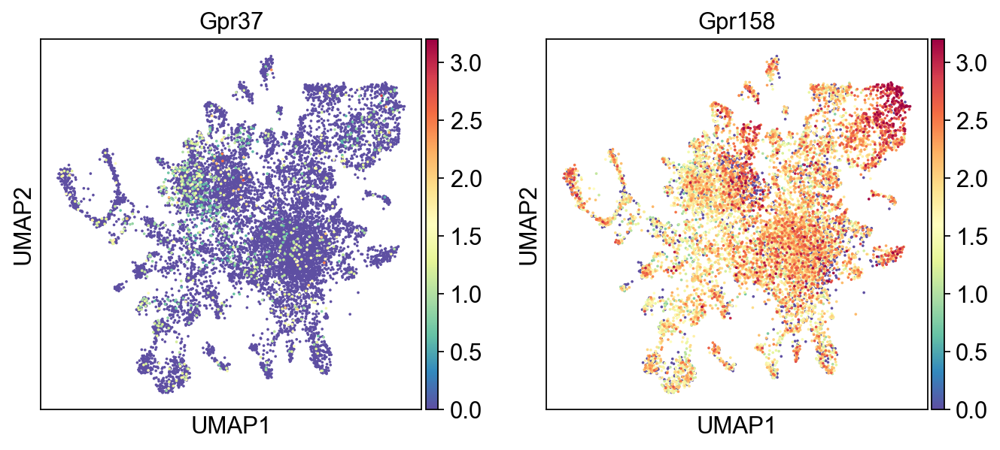

In [122]:
sc.pl.umap(
    Neuron,
    color=["Gpr37","Gpr158"],
    legend_fontsize=8,vmax = 3.2,cmap='Spectral_r',save='Gpr37_158_neuron.pdf'
)

In [100]:
Class_counts = Neuron.obs['Class'].value_counts()
print(Class_counts)

Class
GABA-Glut    6169
Glut         2038
GABA         1771
Dopa         1085
Name: count, dtype: int64


In [101]:
sc.tl.dendrogram(Neuron, groupby="Class")

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Class']`


/opt/anaconda3/lib/python3.11/site-packages/scanpy/tools/_dendrogram.py:190: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = dat


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Class']`


/opt/anaconda3/lib/python3.11/site-packages/scanpy/tools/_dendrogram.py:190: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = dat


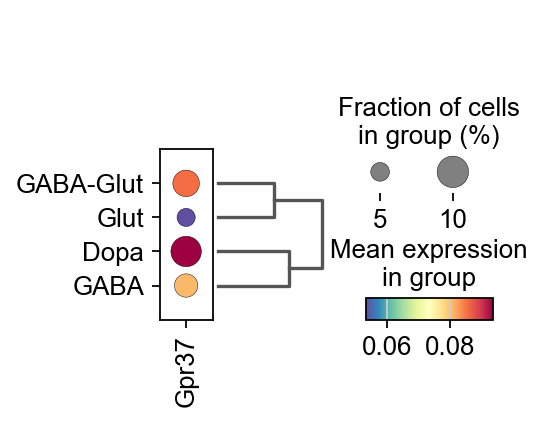

In [123]:
sc.pl.dotplot(Neuron, "Gpr37",groupby=["Class"],cmap='Spectral_r',dendrogram=True,save='Gpr37_neuron.pdf')

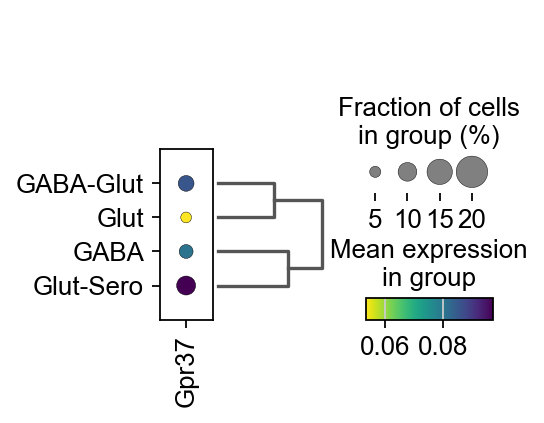

In [41]:
sc.pl.dotplot(Neuron, "Gpr37",groupby=["Class"],cmap='viridis_r',dendrogram=True)

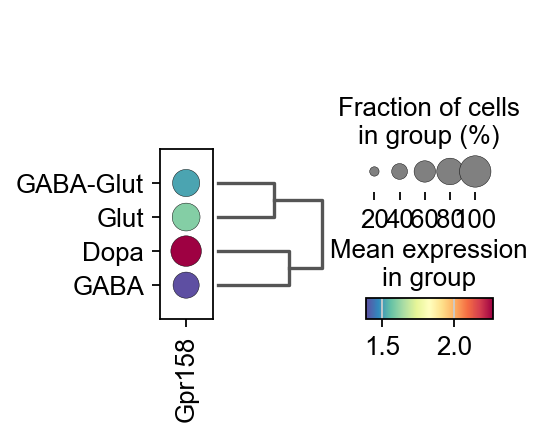

In [124]:
sc.pl.dotplot(Neuron, "Gpr158",groupby=["Class"],cmap='Spectral_r',dendrogram=True,save='Gpr158_neuron.pdf')

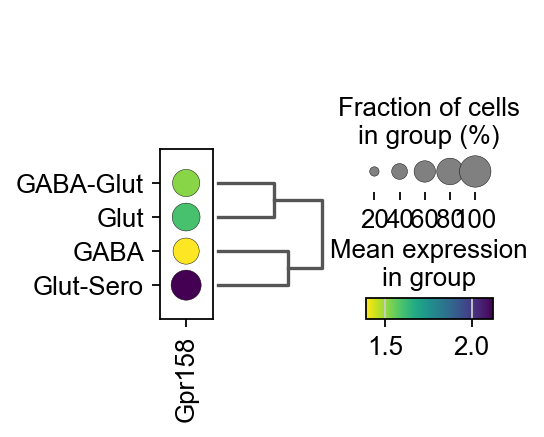

In [42]:
sc.pl.dotplot(Neuron, "Gpr158",groupby=["Class"],cmap='viridis_r',dendrogram=True)

In [43]:
import anndata 
from scipy.stats import zscore
from scipy import sparse 
import itertools
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.decomposition import PCA
from umap import UMAP
from py_pcha import PCHA
from matplotlib.colors import LinearSegmentedColormap
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import pairwise_distances_argmin

In [45]:
Neuron.raw.X

<11329x22948 sparse matrix of type '<class 'numpy.float32'>'
	with 28022204 stored elements in Compressed Sparse Row format>

In [46]:
zlognorm_allgene = zscore(np.array(Neuron.X.todense()), axis=0)
Neuron.layers['zscore'] = zlognorm_allgene
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(zlognorm_allgene)
scale_zlognorm_allgene = scaler.transform(zlognorm_allgene)
Neuron.layers['zscore_scale'] = scale_zlognorm_allgene

/opt/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:473: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:474: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)


In [47]:
Neuron

AnnData object with n_obs × n_vars = 11329 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Neuron', 'Sample', 'Neuron_merge', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'Class'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'hvg', 'neighbors', 'pca', 'umap', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'leiden_res_0.50_colors', 'leiden_res_0.80_colors', 'leiden_res_1.00_colors', 'leiden_res_1.20_colors', 'leiden_res_1.50_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 

In [51]:
gene = ["Gpr37","Gpr158","Kcnk13","Kcna1","Kcna2","Kcnj3","Kcnh2","Kcnd2","Kcnd3"]

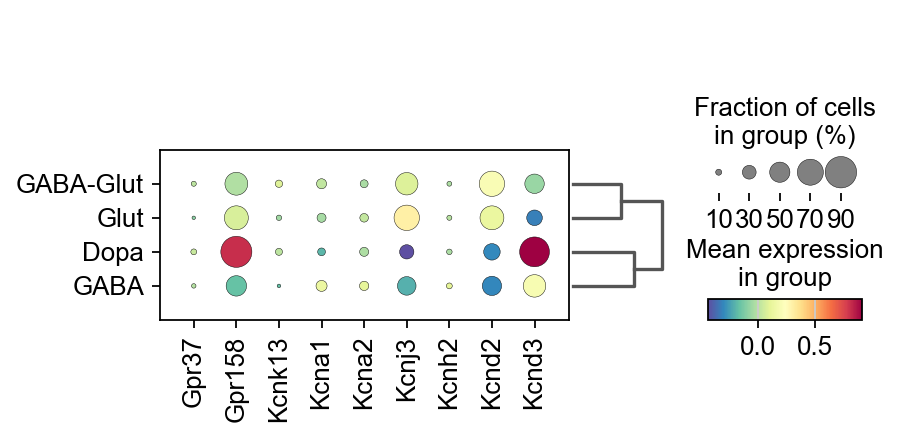

In [105]:
sc.pl.dotplot(Neuron, gene,groupby=["Class"],cmap='Spectral_r',use_raw=False,dendrogram=True)

/opt/anaconda3/lib/python3.11/site-packages/pandas/core/internals/blocks.py:366: RuntimeWarning: invalid value encountered in log1p
  result = func(self.values, **kwargs)


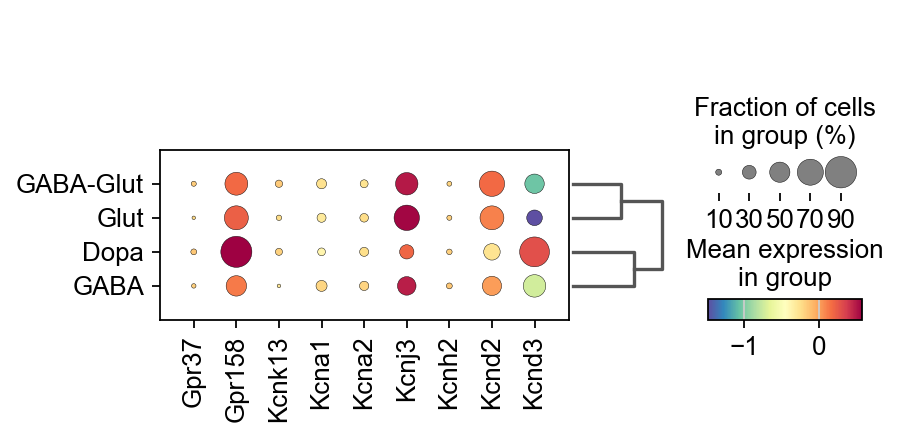

In [106]:
sc.pl.dotplot(Neuron, gene,groupby=["Class"],cmap='Spectral_r',log = True,use_raw=False,dendrogram=True)

In [54]:
Neuron.layers['zscore_scale']

array([[-0.23427784, -1.        , -1.        , ..., -1.        ,
        -1.        ,  0.0319683 ],
       [-0.04824534, -1.        , -1.        , ..., -1.        ,
        -1.        ,  0.06464902],
       [-0.254009  , -1.        , -1.        , ..., -1.        ,
        -1.        ,  0.34400582],
       ...,
       [-0.09791099, -1.        , -1.        , ..., -1.        ,
        -1.        , -1.        ],
       [ 0.35099402, -0.18121007, -0.40372977, ..., -1.        ,
        -1.        , -0.3811629 ],
       [ 0.54287606, -1.        ,  0.11237508, ..., -1.        ,
        -1.        , -1.        ]], dtype=float32)

In [58]:
sc.pp.scale(Neuron, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [60]:
Neuron.X

array([[-0.46718937, -0.791392  , -0.4928674 , ..., -0.04096964,
        -0.03394511,  0.71895295],
       [ 0.04629564, -0.791392  , -0.4928674 , ..., -0.04096964,
        -0.03394511,  0.7836454 ],
       [-0.52165115, -0.791392  , -0.4928674 , ..., -0.04096964,
        -0.03394511,  1.3366401 ],
       ...,
       [-0.09079096, -0.791392  , -0.4928674 , ..., -0.04096964,
        -0.03394511, -1.3238575 ],
       [ 1.148272  ,  1.154242  ,  1.3458691 , ..., -0.04096964,
        -0.03394511, -0.09885196],
       [ 1.6779029 , -0.791392  ,  2.937397  , ..., -0.04096964,
        -0.03394511, -1.3238575 ]], dtype=float32)

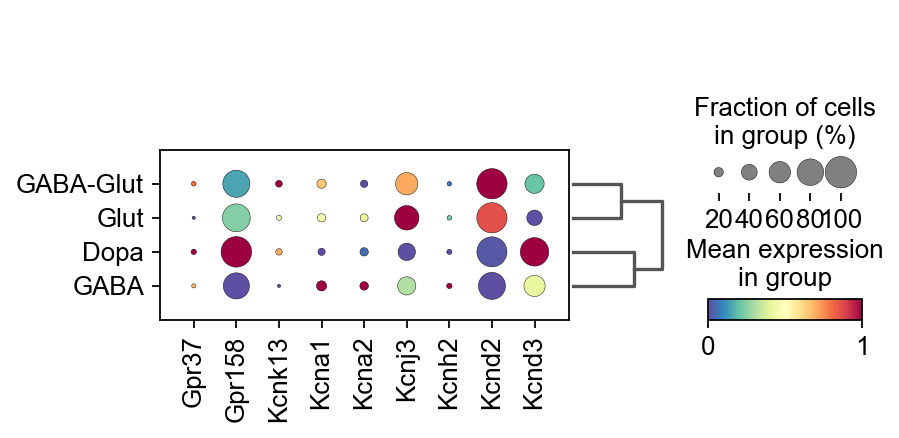

In [107]:
sc.pl.dotplot(Neuron, gene,groupby=["Class"],standard_scale='var',cmap='Spectral_r',dendrogram=True)

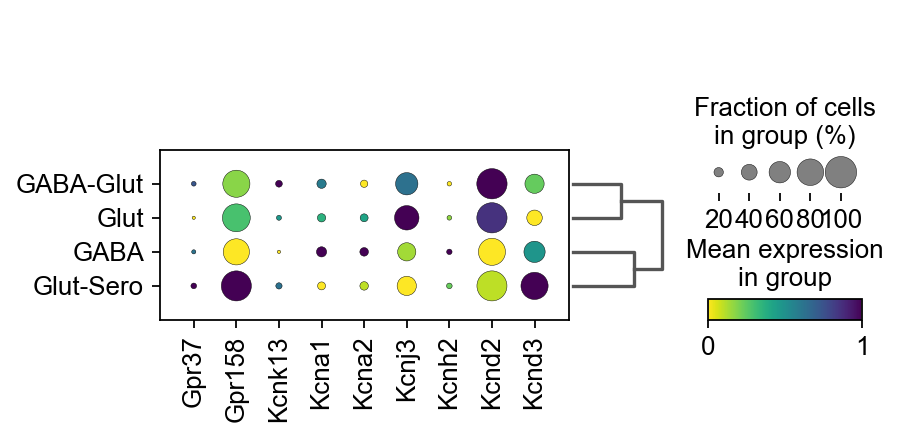

In [66]:
sc.pl.dotplot(Neuron, gene,groupby=["Class"],standard_scale='var',cmap='viridis_r',dendrogram=True)

In [109]:
Neuron.write('VTA_neuron_update.h5ad')

In [113]:
Neuron.X

array([[-0.36479077, -0.76336324, -0.4786672 , ..., -0.03996302,
        -0.0331115 ,  0.74888986],
       [ 0.10708598, -0.76336324, -0.4786672 , ..., -0.03996302,
        -0.0331115 ,  0.8125557 ],
       [-0.41483942, -0.76336324, -0.4786672 , ..., -0.03996302,
        -0.0331115 ,  1.3567742 ],
       ...,
       [-0.01889234, -0.76336324, -0.4786672 , ..., -0.03996302,
        -0.0331115 , -1.2615012 ],
       [ 1.119768  ,  1.1841019 ,  1.3677415 , ..., -0.03996302,
        -0.0331115 , -0.05593645],
       [ 1.6064823 , -0.76336324,  2.96591   , ..., -0.03996302,
        -0.0331115 , -1.2615012 ]], dtype=float32)

In [114]:
adata.X

array([[-0.36479077, -0.76336324, -0.4786672 , ..., -0.03996302,
        -0.0331115 ,  0.74888986],
       [ 0.10708598, -0.76336324, -0.4786672 , ..., -0.03996302,
        -0.0331115 ,  0.8125557 ],
       [-0.41483942, -0.76336324, -0.4786672 , ..., -0.03996302,
        -0.0331115 ,  1.3567742 ],
       ...,
       [-0.01889234, -0.76336324, -0.4786672 , ..., -0.03996302,
        -0.0331115 , -1.2615012 ],
       [ 1.119768  ,  1.1841019 ,  1.3677415 , ..., -0.03996302,
        -0.0331115 , -0.05593645],
       [ 1.6064823 , -0.76336324,  2.96591   , ..., -0.03996302,
        -0.0331115 , -1.2615012 ]], dtype=float32)

In [115]:
adata.raw.X

<11906x22948 sparse matrix of type '<class 'numpy.float32'>'
	with 28469519 stored elements in Compressed Sparse Row format>

In [3]:
adata = sc.read_h5ad('VTA_neuron_update.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 11906 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Neuron', 'Sample', 'Neuron_merge', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'Class'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogram_leiden_res_1.20', 'dendrogram_leiden_res_1.50', 'hvg', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.80', 'leiden_res_0.80_colors', 'leiden_res_1.00', 'leiden_res_1.00_colors', 'leiden_res_1.20', 'leiden_res_1.20_colors', 'leiden_res_1

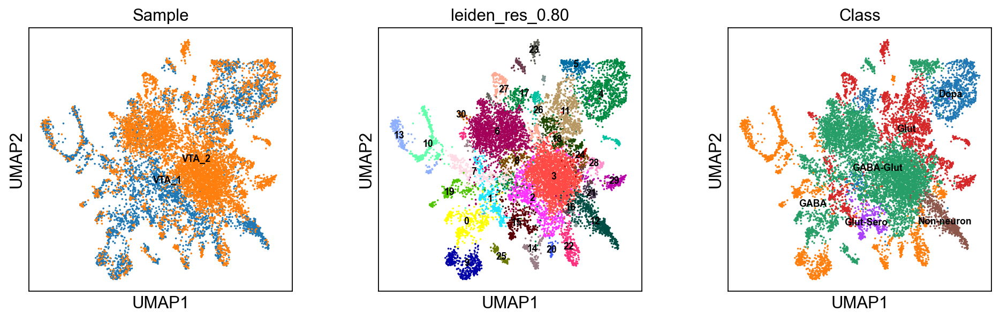

In [118]:
sc.pl.umap(
    adata,
    color=["Sample","leiden_res_0.80","Class"],
    legend_loc="on data",legend_fontsize=8,save= 'VTA-neuron.pdf'
)

In [5]:
Neuron = adata[adata.obs['Class'].isin (['GABA-Glut','Glut','GABA','Dopa']),:]

In [22]:
Neuron

View of AnnData object with n_obs × n_vars = 11063 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Neuron', 'Sample', 'Neuron_merge', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'Class'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogram_leiden_res_1.20', 'dendrogram_leiden_res_1.50', 'hvg', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.80', 'leiden_res_0.80_colors', 'leiden_res_1.00', 'leiden_res_1.00_colors', 'leiden_res_1.20', 'leiden_res_1.20_colors', 'leid

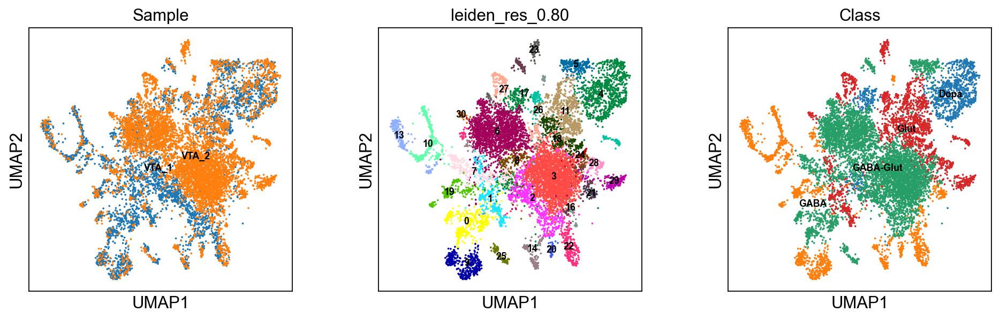

In [121]:
sc.pl.umap(
    Neuron,
    color=["Sample","leiden_res_0.80","Class"],
    legend_loc="on data",legend_fontsize=8,save= 'VTA-neuron.pdf'
)

In [7]:
gaba_glut = Neuron[Neuron.obs['Class']== 'GABA-Glut',:]

In [8]:
gaba_glut

View of AnnData object with n_obs × n_vars = 6169 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Neuron', 'Sample', 'Neuron_merge', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'Class'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogram_leiden_res_1.20', 'dendrogram_leiden_res_1.50', 'hvg', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.80', 'leiden_res_0.80_colors', 'leiden_res_1.00', 'leiden_res_1.00_colors', 'leiden_res_1.20', 'leiden_res_1.20_colors', 'leide

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    with n_comps=50


/opt/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    finished (0:00:00)


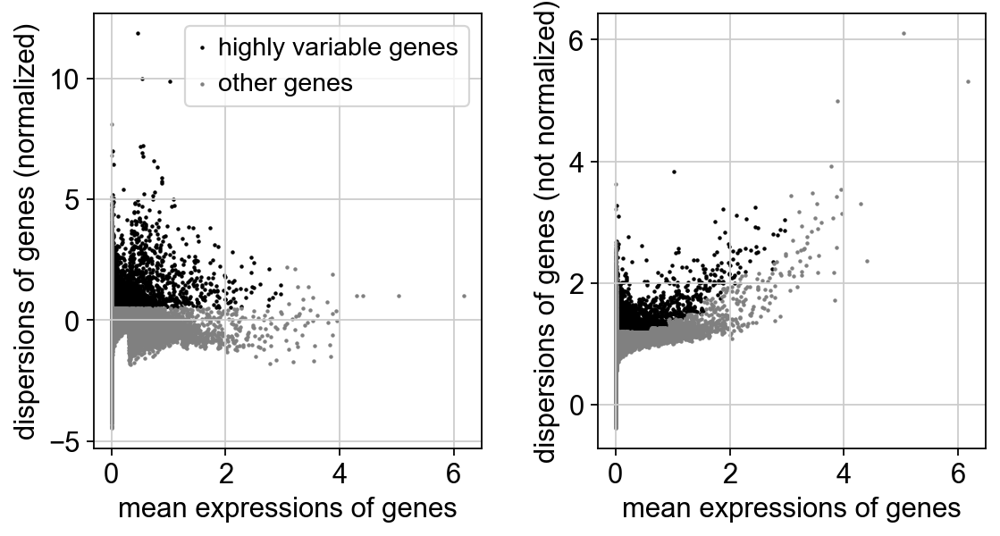

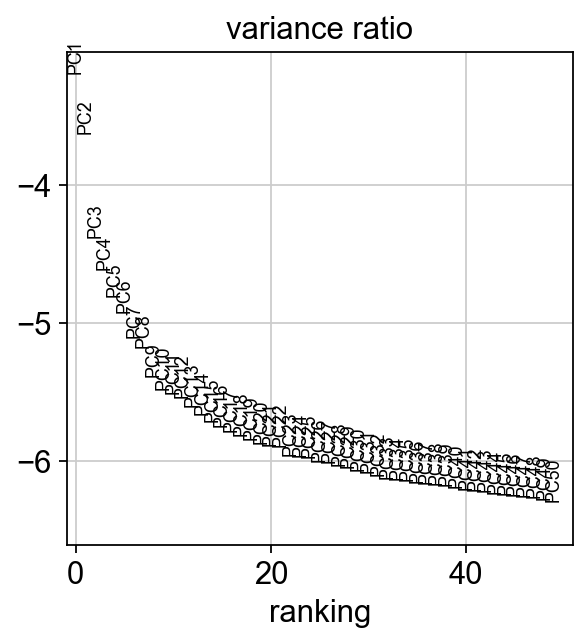

2024-06-05 15:39:45,595 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-06-05 15:39:46,242 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-06-05 15:39:46,256 - harmonypy - INFO - Iteration 1 of 10
2024-06-05 15:39:46,743 - harmonypy - INFO - Iteration 2 of 10
2024-06-05 15:39:47,203 - harmonypy - INFO - Converged after 2 iterations


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden_res_0.05', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden_res_0.07', the cluster labels (adata.obs, categorical) (0:00:00)


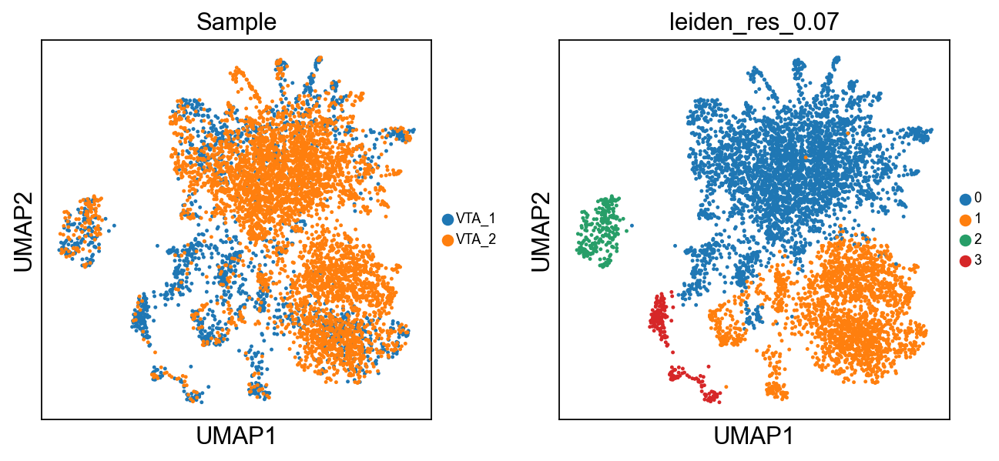

In [10]:
sc.pp.highly_variable_genes(gaba_glut, min_mean=0.0125, max_mean=3, min_disp=0.5,flavor='seurat')
sc.set_figure_params(color_map='RdBu_r')
sc.tl.pca(gaba_glut, svd_solver='arpack',use_highly_variable=True)
sc.pl.highly_variable_genes(gaba_glut)
sc.pl.pca_variance_ratio(gaba_glut, n_pcs=50, log=True)
sc.external.pp.harmony_integrate(gaba_glut, 'Sample', basis='X_pca', adjusted_basis='X_harmony')
sc.pp.neighbors(gaba_glut, n_neighbors=20, use_rep='X_harmony')
sc.tl.umap(gaba_glut)
for res in [0.05,0.07]:
    sc.tl.leiden(
        gaba_glut, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )
sc.pl.umap(
    gaba_glut,
    color=["Sample","leiden_res_0.07"],
    legend_fontsize=8
)

In [11]:
for res in [0.05,0.07]:
    sc.tl.dendrogram(gaba_glut, groupby=f"leiden_res_{res:4.2f}",use_rep='X_harmony')

Storing dendrogram info using `.uns['dendrogram_leiden_res_0.05']`
Storing dendrogram info using `.uns['dendrogram_leiden_res_0.07']`


In [12]:
marker_gene = ['Slc17a6','Slc17a7','Slc17a8','Snap25','Slc32a1','Slc18a2','Gad1','Gad2','Aldh1a1','Th','Ddc','Slc6a3','Slc6a4','Tph2']

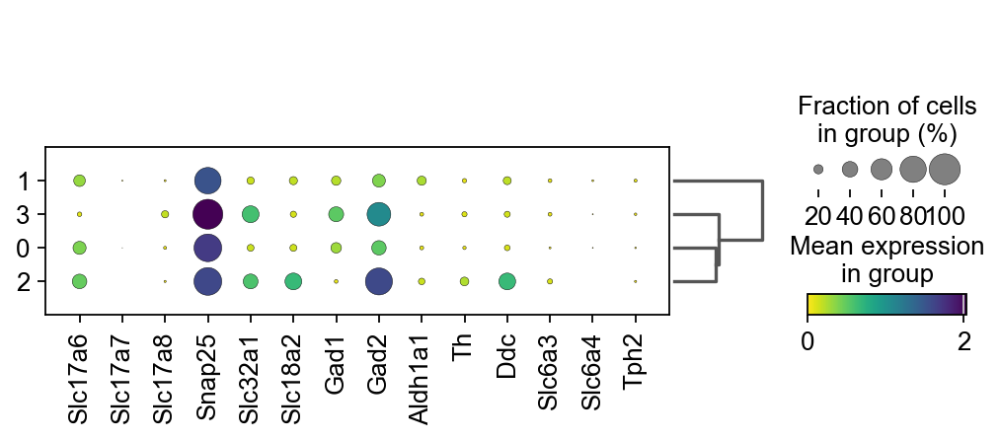

In [13]:
sc.pl.dotplot(gaba_glut, marker_gene,groupby=["leiden_res_0.07"],cmap='viridis_r',dendrogram=True)

In [14]:
Class_counts = gaba_glut.obs['leiden_res_0.07'].value_counts()
print(Class_counts)

leiden_res_0.07
0    3620
1    2116
2     238
3     195
Name: count, dtype: int64


In [15]:
gaba_glut

AnnData object with n_obs × n_vars = 6169 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Neuron', 'Sample', 'Neuron_merge', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'Class', 'leiden_res_0.05', 'leiden_res_0.07'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogram_leiden_res_1.20', 'dendrogram_leiden_res_1.50', 'hvg', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.80', 'leiden_res_0.80_colors', 'leiden_res_1.00', 'leiden_res_1.00_colors', 'leiden_res_1.20', 'l

In [19]:
Class_final = []
for i in range(gaba_glut.shape[0]):
    if int(gaba_glut.obs['leiden_res_0.07'][i]) in (0,1):
        Class_final.append('GABA-Glut')
    elif int(gaba_glut.obs['leiden_res_0.07'][i]) == 3:
        Class_final.append('GABA')
    elif int(gaba_glut.obs['leiden_res_0.07'][i]) == 2:
        Class_final.append('Dopa')

/var/folders/r4/hfj1yx3s3bd93mtgxzfwcfyc0000gn/T/ipykernel_93596/3433867998.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if int(gaba_glut.obs['leiden_res_0.07'][i]) in (0,1):
/var/folders/r4/hfj1yx3s3bd93mtgxzfwcfyc0000gn/T/ipykernel_93596/3433867998.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  elif int(gaba_glut.obs['leiden_res_0.07'][i]) == 3:
/var/folders/r4/hfj1yx3s3bd93mtgxzfwcfyc0000gn/T/ipykernel_93596/3433867998.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior).

In [20]:
gaba_glut.obs['Class_final'] = Class_final

In [21]:
adata

AnnData object with n_obs × n_vars = 11906 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Neuron', 'Sample', 'Neuron_merge', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'Class'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogram_leiden_res_1.20', 'dendrogram_leiden_res_1.50', 'hvg', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.80', 'leiden_res_0.80_colors', 'leiden_res_1.00', 'leiden_res_1.00_colors', 'leiden_res_1.20', 'leiden_res_1.20_colors', 'leiden_res_1

In [23]:
Neuron

View of AnnData object with n_obs × n_vars = 11063 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Neuron', 'Sample', 'Neuron_merge', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'Class'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogram_leiden_res_1.20', 'dendrogram_leiden_res_1.50', 'hvg', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.80', 'leiden_res_0.80_colors', 'leiden_res_1.00', 'leiden_res_1.00_colors', 'leiden_res_1.20', 'leiden_res_1.20_colors', 'leid

In [24]:
df = pd.DataFrame()
index = list(gaba_glut.obs.index)
Class = list(gaba_glut.obs['Class_final'])
df.index = index
df['Class'] = Class
dic = df['Class'].to_dict()

In [26]:
Class_final = []
for i in range(Neuron.shape[0]):
    if Neuron.obs.index[i] in dic.keys():
        Class_final.append(dic[Neuron.obs.index[i]])
    else: 
        Class_final.append(Neuron.obs.Class[i])
Neuron.obs['Class_final'] = Class_final

/var/folders/r4/hfj1yx3s3bd93mtgxzfwcfyc0000gn/T/ipykernel_93596/1892322224.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  Class_final.append(Neuron.obs.Class[i])
/var/folders/r4/hfj1yx3s3bd93mtgxzfwcfyc0000gn/T/ipykernel_93596/1892322224.py:7: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  Neuron.obs['Class_final'] = Class_final


In [27]:
Neuron.obs['Class_final'] 

AAACCCAAGACTGTTC-1-VTA_1    GABA-Glut
AAACCCAGTAACGCGA-1-VTA_1         Glut
AAACCCAGTCACTAGT-1-VTA_1    GABA-Glut
AAACGAAAGAGCATTA-1-VTA_1         Dopa
AAACGAAAGGTCACAG-1-VTA_1         Dopa
                              ...    
TTTGTTGGTGTCACAT-1-VTA_2         Glut
TTTGTTGGTTACCTGA-1-VTA_2    GABA-Glut
TTTGTTGGTTCCCACT-1-VTA_2         Glut
TTTGTTGTCACGAACT-1-VTA_2    GABA-Glut
TTTGTTGTCCTCTTTC-1-VTA_2         Glut
Name: Class_final, Length: 11063, dtype: object

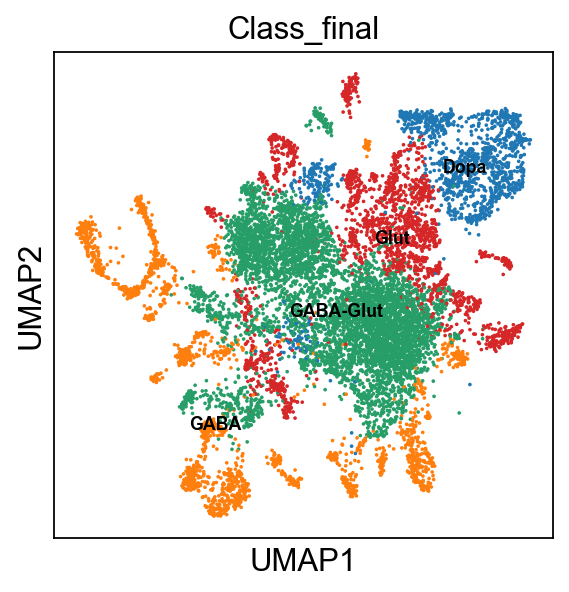

In [29]:
sc.pl.umap(
    Neuron,
    color="Class_final",
    legend_loc="on data",legend_fontsize=8,save='Neuron_class_final.pdf'
)

In [30]:
Class_counts = Neuron.obs['Class_final'].value_counts()
print(Class_counts)

Class_final
GABA-Glut    5736
Glut         2038
GABA         1966
Dopa         1323
Name: count, dtype: int64
